# TSIA202a - Third Practice Session

The goal of this third partical work is to use an AR(p) process to model a speech signal, and show that this approch is surprisingly powerful despite its simplicity.

The proposed synthesis algorithm divides into several steps.
1. Filter the audio signal to emphasize the highest frequencies (in order to flatten the spectrum and reduce precision issues with FFT computations).
2. Split the signal into several overlapping frames and iterate over them.
    1. Detect if the frame corresponds to noise or to a voiced signal, and estimate the fundamental frequency in the later case.
    2. Estimate the AR(p) coefficients using Yule-Walker equations.
    3. Re-synthetise the frame using the AR(p) coefficients, starting from a white noise in the case of a noisy frame, or a Dirac comb in the case of a voiced frame.
3. Overlap-add the synthesized frames with a Hanning window.
4. Filter the synthesised signal to de-emphasize the highest frequencies.

We propose to implement this algorithm in two parts. First, we will derive the Yule-Walker equations, and test them on synthetic data. Then, we will code the synthesis algorithm and apply it on a real world speech signal.


# 1. Yule-Walker equations

Let us consider a causal, zero-mean, AR(p) process defined by the following recurrent equation: 
$$
X_t = \phi_1 X_{t-1} + \phi_2 X_{t-2} + \ldots + \phi_p X_{t-p} + Z_t
$$
where $\{Z_t , t \in \mathbb{Z}\}$ is a weak white noise with variance $\sigma^2$.

1. Show that, $\forall h \geq 1, \mathbb{E}[X_{t-h}Z_t]=0$.
2. Deduce a recurrent relation between $\gamma(h)$ and $\gamma(h-1),\gamma(h-2),\ldots,\gamma(h-p)$, for $h \geq 1$.
3. We consider separately the case $h=0$: find a new relationship between $\gamma(0)$ and $\gamma(-1),\gamma(-2),\ldots,\gamma(-p)$.
4. Put these relationships in matrix form:
\begin{equation}
\Gamma_{p+1}[1 \; -\phi_1 \; \ldots \; -\phi_p]^T = [\sigma_2 \; 0 \; \ldots \; 0]^T 
\end{equation}
where $\Gamma_{p+1}$ is a suitable Toeplitz matrix that you have to determine.

---

1/

For $h \geq 1$,

$$
\mathbb{E}[X_{t-h} Z_t] = \mathbb{E}[(\phi_1 X_{t-h-1} + \phi_2 X_{t-h-2} + \ldots + \phi_p X_{t-h-p} + Z_{t-h}) Z_t].
$$

Using the properties of white noise $Z_t$ is uncorrelated with $X_{t-h}$ and $Z_{t-h}$ so it implies:

$$
\mathbb{E}[Z_t Z_{t-h}] = 0 \quad \text{and} \quad \mathbb{E}[Z_t X_{t-h}] = 0.
$$

Thus, we have the wanted result:
$$
\mathbb{E}[X_{t-h} Z_t] = 0.
$$

---

2/

From the AR($p$) model, for $h \geq 1$:
$$
\gamma(h) = \mathbb{E}[X_t X_{t-h}] = \mathbb{E}[(\phi_1 X_{t-1} + \phi_2 X_{t-2} + \ldots + \phi_p X_{t-p} + Z_t) X_{t-h}].
$$

Using linearity of expectation and the result of question 1/:

$$
\gamma(h) = \phi_1 \mathbb{E}[X_{t-1} X_{t-h}] + \phi_2 \mathbb{E}[X_{t-2} X_{t-h}] + \ldots + \phi_p \mathbb{E}[X_{t-p} X_{t-h}].
$$

Recognizing the autocovariance terms:
$$
\gamma(h) = \phi_1 \gamma(h-1) + \phi_2 \gamma(h-2) + \ldots + \phi_p \gamma(h-p).
$$

This is the **recurrent relation** for \(h \geq 1\):
$$
\gamma(h) = \sum_{k=1}^p \phi_k \gamma(h-k).
$$

---

3/

When $h = 0$, $\gamma(0)$ is the variance of $X_t$, and from the AR($p$) equation:

$$
X_t = \phi_1 X_{t-1} + \phi_2 X_{t-2} + \ldots + \phi_p X_{t-p} + Z_t.
$$

Taking the variance on both sides:
$$
\text{Var}(X_t) = \phi_1^2 \text{Var}(X_{t-1}) + \phi_2^2 \text{Var}(X_{t-2}) + \ldots + \phi_p^2 \text{Var}(X_{t-p}) + \sigma^2.
$$

Using stationarity $\text{Var}(X_t) = \gamma(0)$ and $\gamma(k) = \gamma(-k)$:
$$
\gamma(0) = \sum_{k=1}^p \phi_k \gamma(k) + \sigma^2.
$$

---

4/ Matrix Formulation:

We can write the system of equations for $\gamma(h)$ $(h = 0, 1, \ldots, p)$ in matrix form. Let:

$$
\mathbf{\Gamma}_{p+1} =
\begin{bmatrix}
\gamma(0) & \gamma(1) & \gamma(2) & \cdots & \gamma(p) \\
\gamma(1) & \gamma(0) & \gamma(1) & \cdots & \gamma(p-1) \\
\gamma(2) & \gamma(1) & \gamma(0) & \cdots & \gamma(p-2) \\
\vdots    & \vdots    & \vdots    & \ddots & \vdots \\
\gamma(p) & \gamma(p-1) & \gamma(p-2) & \cdots & \gamma(0)
\end{bmatrix}.
$$

Define the coefficient vector:
$$
\mathbf{\phi} =
\begin{bmatrix}
1 \\
-\phi_1 \\
-\phi_2 \\
\vdots \\
-\phi_p
\end{bmatrix}.
$$

The system becomes:
$$
\mathbf{\Gamma}_{p+1} \mathbf{\phi} =
\begin{bmatrix}
\sigma^2 \\
0 \\
0 \\
\vdots \\
0
\end{bmatrix}.
$$

---

# 2. Evaluation on synthetic data

We will now evaluate equation $(1)$ on a synthetically generated AR(p) process.

1. Generate n=1000 samples of an AR(4) process.
2. Estimate $\Gamma_{p+1}$ using these samples.
3. Use equation $(1)$ to estimate $\sigma^2$ and the coefficients $\phi_1,\phi_2,\ldots,\phi_p$. Compute the relative error between the estimated and the true coefficients.
4. Estimate power spectral distribution of the synthesized signal. Compare with the theoretical distribution obtained from the poles of $1/\Phi(z^{-1})$.


In [6]:
## imports

import librosa
import soundfile as sf
import scipy
import numpy as np
import math
from collections import defaultdict
from tqdm import tqdm
import matplotlib.animation
import matplotlib.pyplot as plt
from IPython.display import HTML

1. Generate n=1000 samples of an AR(4) process.

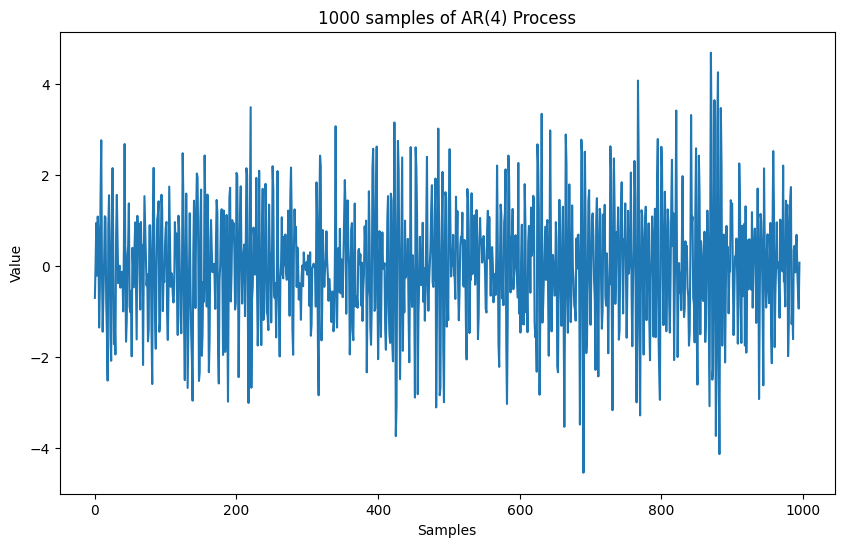

In [21]:
phi = np.array([0.2, -0.4, -0.3, 0.1])
n = 1000
sigma = 1
p = 4

def generate_arp_process(n, phi_values, sigma):

    p = len(phi_values)
    Z = np.random.normal(0, sigma, n) # Z ~ WN(0,sigma)
    ar_process = [0] * p

    for t in range(p, n):
        ar_process.append(sum(phi_values[j] * ar_process[t - j - 1] for j in range(p)) + Z[t])

    ar_process = [sum(phi_values[j] * ar_process[t - j - 1] for j in range(p)) + Z[t] for t in range(p, n)]

    return ar_process

ar_process = generate_arp_process(n, phi, sigma)
plt.figure(figsize=(10, 6))
plt.plot(ar_process)
plt.title('1000 samples of AR(4) Process')
plt.xlabel('Samples')
plt.ylabel('Value')
plt.show()

2. Estimate $\Gamma_{p+1}$ using these samples.

In [22]:
def autocovariance(signal, h):
    n = len(signal)
    mean = np.mean(signal)
    autocovar = np.sum((signal[:n - h] - mean) * (signal[h:] - mean)) / n
    return autocovar

gamma_pp1 = np.zeros((p+1, p+1))

for row in range(p+1):
    for col in range(p+1):
        gamma_pp1[row][col] = autocovariance(ar_process, abs(row - col))

# Display gamma as a matrix
for row in gamma_pp1:
    print(row)

[ 1.74648774  0.36648557 -0.90818704 -0.85814411  0.29095484]
[ 0.36648557  1.74648774  0.36648557 -0.90818704 -0.85814411]
[-0.90818704  0.36648557  1.74648774  0.36648557 -0.90818704]
[-0.85814411 -0.90818704  0.36648557  1.74648774  0.36648557]
[ 0.29095484 -0.85814411 -0.90818704  0.36648557  1.74648774]


3. Use equation $(1)$ to estimate $\sigma^2$ and the coefficients $\phi_1,\phi_2,\ldots,\phi_p$. Compute the relative error between the estimated and the true coefficients.

In [25]:
target = np.zeros(p+1)
target[0] = 1

phi_sigma = np.linalg.solve(gamma_pp1, target)

estimated_phi = -phi_sigma[1:]
estimated_sigma_squared = phi_sigma[0]

print("phi :", phi)

print("phi estimation :", estimated_phi)
error_phi = sum(abs(x - y) for x, y in zip(phi, estimated_phi)) / sum(abs(y) for y in estimated_phi)
print("Relative error for phi:", error_phi)

print("sigma squared :", sigma*sigma)

print("Estimation of sigma squared :", estimated_sigma_squared)
error_sigma = abs(sigma*sigma - estimated_sigma_squared) / abs(estimated_sigma_squared)
print("Relative error for sigma squared:", error_sigma)

phi : [ 0.2 -0.4 -0.3  0.1]
phi estimation : [ 0.18390364 -0.45218302 -0.33407474  0.09633577]
Relative error for phi: 0.09940800493874713
sigma squared : 1
Estimation of sigma squared : 1.026505006484544
Relative error for sigma squared: 0.025820630505559154


4. Estimate power spectral distribution of the synthesized signal. Compare with the theoretical distribution obtained from the poles of $1/\Phi(z^{-1})$..

<Figure size 640x480 with 0 Axes>

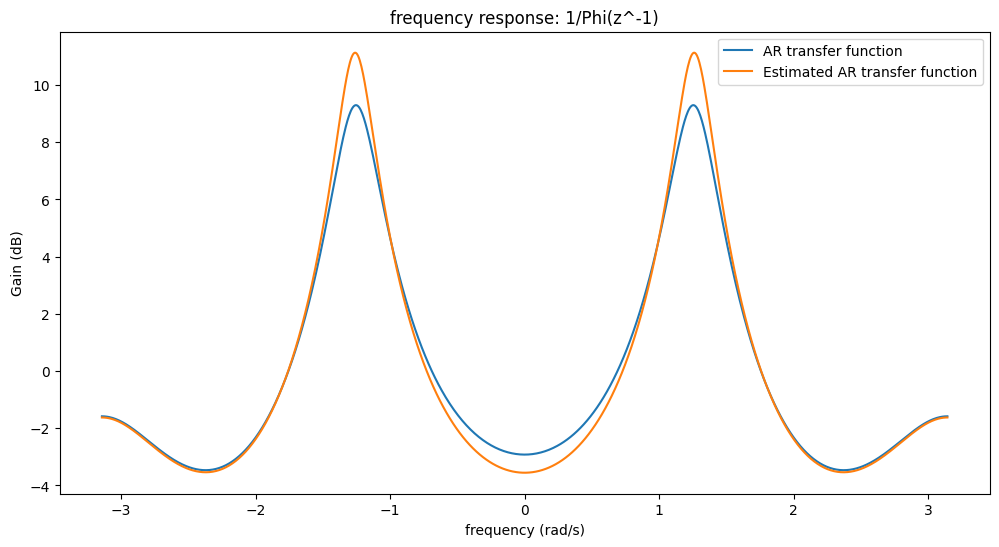

Text(0.5, 1.0, 'Poles of the AR transfer function')

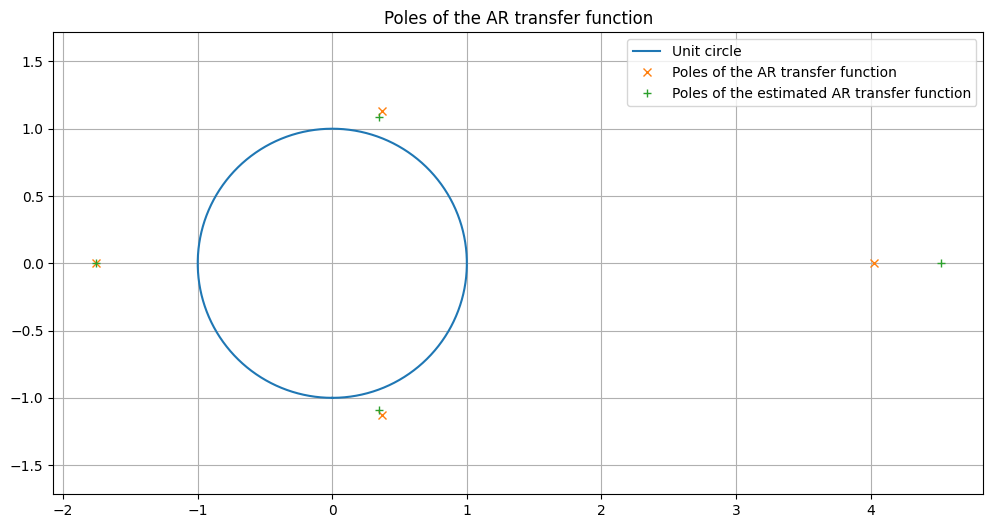

In [27]:
plt.figure()

coeff = np.concatenate(([1], -phi[:]))[::-1]
coeff_estimated = np.concatenate(([1],-estimated_phi[:]))[::-1]

nPoints = int(np.exp2(np.ceil(np.log2(n))))
omega = np.linspace(-np.pi, np.pi, nPoints)

_, response = scipy.signal.freqz(1,coeff, worN=omega)
_, response_est = scipy.signal.freqz(1,coeff_estimated, worN=omega)

z = np.roots(coeff)
z_est = np.roots(coeff_estimated)

plt.figure(figsize=(12, 6))
plt.plot(omega, 20 * np.log10(np.abs(response)))
plt.plot(omega, 20 * np.log10(np.abs(response_est)))
plt.title('frequency response: 1/Phi(z^-1)')
plt.xlabel('frequency (rad/s)')
plt.ylabel('Gain (dB)')
plt.legend(['AR transfer function','Estimated AR transfer function' ])
plt.show()

plt.figure(figsize=(12, 6))
t = np.linspace(-np.pi,np.pi,1024)
plt.plot(np.sin(t),np.cos(t))
plt.axis('equal')
plt.grid()
plt.plot(np.real(z),np.imag(z), 'x')
plt.plot(np.real(z_est),np.imag(z_est), '+' )
plt.legend(['Unit circle','Poles of the AR transfer function','Poles of the estimated AR transfer function' ], loc='upper right')
plt.title('Poles of the AR transfer function')

# 3. Speech modeling

We will now implement the synthesis algorithm and evaluate it on a speech signal. 

A code template is provided below. We will use the file audio.wav to test the algorithm. 


LIsten to the original and synthesized signal by using any audio player. Try to modify the pitch of the synthesised signal and listen to the result.

In [7]:
## hyperparameters

sampling_rate = 8000 # (Hz)
frame_duration = 0.04 # duration of the analysis frames (seconds)
overlap_ratio = 0.5 # overlap ratio between two consecutive analysis frames
p = 12 # AR(p) model order
f_min = 80 # minimum frequency for pitch detection (Hz)
f_max = 400 # maximum frequency for pitch detection Hz)
pitch_detection_threshold = 0.5 # threshold for pitch detection

In [ ]:
## synthesis

# load audio
x = librosa.load('audio.wav', sr=sampling_rate)[0]

# pre-emphasis filtering
x = scipy.signal.lfilter([1, -0.98], [1], x)

# handy variables
n_frame = math.floor(len(x) / (sampling_rate * frame_duration * (1 - overlap_ratio))) - 1  # discard last frame
frame_length = int(sampling_rate * frame_duration)
min_period = math.floor(sampling_rate / f_max)
max_period = math.ceil(sampling_rate / f_min)
synthesis = np.zeros(len(x))
log_dict = defaultdict(list)

# loop over frames
for frame_index in tqdm(range(n_frame)):

    # extract frame
    start = int(frame_index * sampling_rate * frame_duration * (1 - overlap_ratio))
    end = start + frame_length
    frame = x[start:end]

    # detect pitch
    auto_covariance = np.fft.irfft(np.abs(np.fft.rfft(frame - np.mean(frame), (2 * frame_length - 1)))**2 / frame_length)[:frame_length]
    pitch, max_value = auto_covariance[min_period:].argmax() + min_period, auto_covariance[min_period:].max() / auto_covariance[0]
    if (pitch > max_period) or (max_value * frame_length / (frame_length - pitch) < pitch_detection_threshold):  # detect silent frame
        pitch = 0

    # estimate AR(p) coefficients
    """ We compute autocorellation gamma and Toeplitz matrix using the first p gamma values.
    Then we use the Yule-Walker eqn to estimate the AR coeffs and VAR
    """
    gamma = gamma_pp1
    v = np.array([1 if k==0 else 0 for k in range(p+1)])
    coefficient = np.concatenate(([1],-estimated_phi[:]))
    sigma = gamma[0][0]

    # re-synthetise frame
    if pitch == 0:
        noise = np.random.normal(0, np.sqrt(sigma), frame_length + p) # Random noise
        frame_r = scipy.signal.lfilter([1], coefficient, noise)
    else:
        dirac_comb = np.zeros(frame_length + p)
        dirac_comb[::pitch] = 1
        frame_r = scipy.signal.lfilter([1], coefficient, dirac_comb)
    frame_r = frame_r[p:]
    normalization_factor = np.sqrt(sigma / np.var(frame_r))
    frame_r = normalization_factor * frame_r[:frame_length]

    # overlap-add
    synthesis[start:end] += frame_r * np.hanning(frame_length)

    # compute power spectral density (for logging purposes)
    _, original_psd = scipy.signal.freqz(1,np.concatenate(([1],-phi[:])), worN=omega)
    _, synthesis_psd = scipy.signal.freqz(1,coefficient, worN=omega)
    original_psd = abs(original_psd)
    synthesis_psd = abs(synthesis_psd)
    

    # log
    log_dict["frame"].append(frame)
    log_dict["pitch"].append(pitch)
    log_dict["sigma"].append(sigma)
    log_dict["coefficient"].append(coefficient)
    log_dict["frame_r"].append(frame_r)
    log_dict["original_psd"].append(original_psd)
    log_dict["synthesis_psd"].append(synthesis_psd)

# de-emphasis filtering
synthesis = scipy.signal.lfilter([1], [1, -0.98], synthesis)

# log
sf.write('synthesis.wav', synthesis, sampling_rate)
log_dict["synthesis"].append(synthesis)
log_dict = {k: np.array(v) for k, v in log_dict.items()}

100%|██████████| 279/279 [00:00<00:00, 4894.68it/s]


We re-synthetised using the computed AR($p$) coefficients. The coefficients are compute using Yule-Walker equations after computing gamma and the Toeplitz martix.

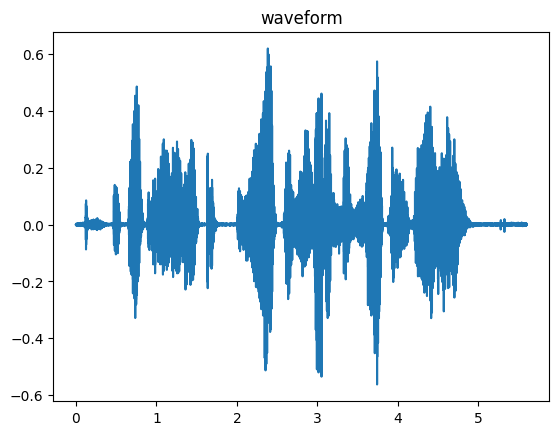

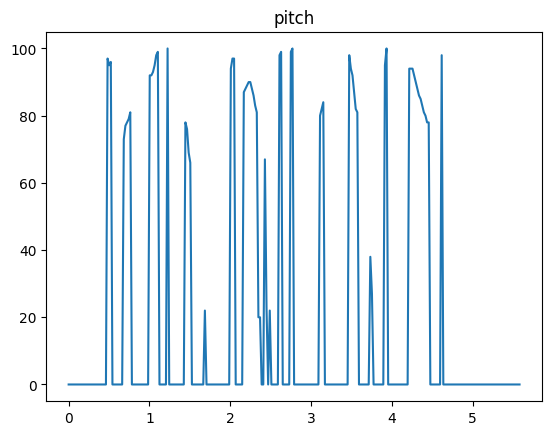

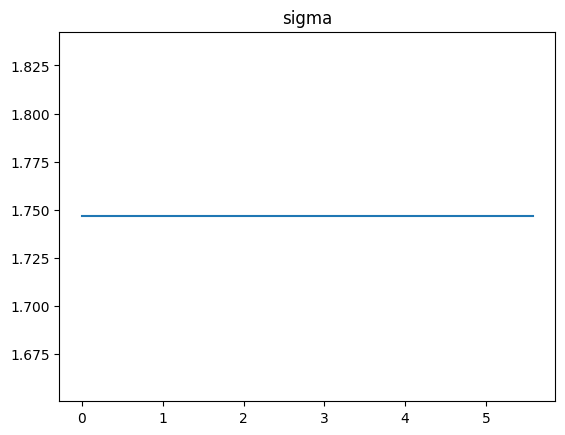

In [37]:
## plot

# time axis for plotting
sample_time = np.linspace(0, len(x)/sampling_rate, len(x))
frame_time = np.linspace(0, n_frame*frame_duration*(1-overlap_ratio), n_frame)

# waveform
plt.title("waveform")
plt.plot(sample_time, x)
plt.show()

# pitch
plt.title("pitch")
plt.plot(frame_time, log_dict["pitch"])
plt.show()

# variance
plt.title("sigma")
plt.plot(frame_time, log_dict["sigma"])
plt.show()

# power spectral density
fig, ax = plt.subplots()
fig.suptitle("estimated & theoretical spectral density")
y_min = min(log_dict["original_psd"].min(), log_dict["synthesis_psd"].min())
y_max = max(log_dict["original_psd"].max(), log_dict["synthesis_psd"].max())
def animate(i):
    ax.cla()
    ax.set_ylim([y_min-0.1, y_max+0.1])
    ax.plot(log_dict["original_psd"][i], label="original_psd")
    ax.plot(log_dict["synthesis_psd"][i], label="synthesis_psd")
animation = matplotlib.animation.FuncAnimation(fig, animate, frames=len(log_dict["original_psd"]))
display(HTML(animation.to_jshtml()))
plt.close()

We plotted the graphs above. The synthetized signal is saved as synthesis.wav for playback. The pitch can be modified by scaling the detected pitch within the loop. For example, by multipliying will affect the pitch of the voiced frames in the synthetised signal.
The plots and observations give us a theorical and empirical observations for the re-synthetisation of the signal using AR($p$) protocol.